In [1]:
import sidechainnet as scn
from sidechainnet.utils.minimizer import SCNMinimizer
import torch
import numpy as np
torch.set_printoptions(precision=6, sci_mode=False)

In [2]:
!ls -hlt ~/scnmin*/*minimized* 

-rw-r--r-- 1 jok120 koes 4.0G Nov 15 02:09 /net/pulsar/home/koes/jok120/scnmin221013/scn_minimized.pkl
-rw-r--r-- 1 jok120 koes 4.3G Oct  3 17:30 /net/pulsar/home/koes/jok120/scnmin220915/scn_minimized.pkl
-rw-r--r-- 1 jok120 koes  60M Oct  3 17:08 /net/pulsar/home/koes/jok120/scnmin221001/scn_minimized.pkl
-rw-r--r-- 1 jok120 koes 5.7G May 30  2022 /net/pulsar/home/koes/jok120/scnmin220519/scn_unminimized.pkl
-rw-r--r-- 1 jok120 koes 5.7G May 21  2022 /net/pulsar/home/koes/jok120/scnmin220519/scn_minimized.pkl
-rw-r--r-- 1 jok120 koes 494M May  3  2022 /net/pulsar/home/koes/jok120/scnmin220502/scn_minimized.pkl
-rw-r--r-- 1 jok120 koes  45M May  3  2022 /net/pulsar/home/koes/jok120/scnmin220502/scn_minimized_small.pkl


In [65]:
# d = scn.load(local_scn_path="/net/pulsar/home/koes/jok120/scnmin221013/scn_minimized.pkl")
for p in d:
    if "2RQW" in p.id:
        print(p)
        break

SCNProtein(2RQW_2_B, len=24, missing=0, split='train')


In [66]:
p.to_3Dmol()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [68]:
x = scn.SCNProtein.from_pkl("/net/pulsar/home/koes/jok120/scnmin221001/unmin/2RQW_2_B.pkl")
x.to_3Dmol()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [12]:
# !ls ~/scnmin*/unmin/3TXA*

/net/pulsar/home/koes/jok120/scnmin220511/unmin/3TXA_1_A.pkl
/net/pulsar/home/koes/jok120/scnmin220901/unmin/3TXA_1_A.pkl
/net/pulsar/home/koes/jok120/scnmin220905/unmin/3TXA_1_A.pkl
/net/pulsar/home/koes/jok120/scnmin220930/unmin/3TXA_1_A.pkl
/net/pulsar/home/koes/jok120/scnmin221001/unmin/3TXA_1_A.pkl


In [53]:
# !cp /net/pulsar/home/koes/jok120/scnmin221001/unmin/4P99_1_A.pkl .
# p = scn.SCNProtein.from_pkl("/net/pulsar/home/koes/jok120/scnmin221001/unmin/1QQB_d1qqba1.pkl")
p.to_pdb("4P99_1_A.pdb")


# 3TXA

Starting minimization...
   LR = 1
Starting loss = 824807629595607.62
Epoch 0:	824807629596113.12
Epoch 1:	162973643398.24
Updated best angles.
Epoch 2:	10917775883871.13
Epoch 3:	409449.10
Updated best angles.
Epoch 4:	389228.38
Updated best angles.
Epoch 5:	50611.22
Updated best angles.
Epoch 6:	256923.31
Epoch 7:	116422755.14
Epoch     8: reducing learning rate of group 0 to 1.0000e-01.
Epoch 8:	35317.29
Updated best angles.
Epoch 9:	28233.26
Updated best angles.
Epoch 10:	24453.05
Updated best angles.
Epoch 11:	22285.77
Updated best angles.
Epoch 12:	20545.47
Updated best angles.
Epoch 13:	19121.71
Updated best angles.
Epoch 14:	17933.71
Updated best angles.
Epoch 15:	16885.57
Updated best angles.
Epoch 16:	15976.96
Updated best angles.
Epoch 17:	15244.80
Updated best angles.
Epoch 18:	14561.63
Updated best angles.
Epoch 19:	14146.30
Updated best angles.
Epoch 20:	13444.52
Updated best angles.
Epoch 21:	12950.69
Updated best angles.
Epoch 22:	12397.43
Updated best angles.
Epoch 23:

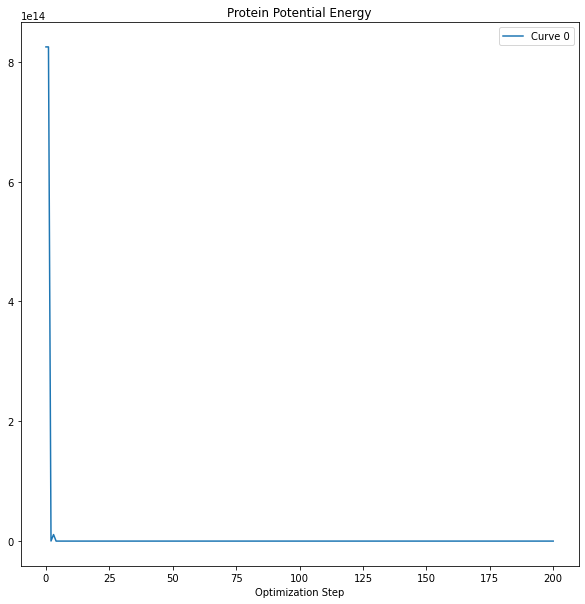

In [25]:
m = SCNMinimizer({}, verbose=True)

# p_original = scn.SCNProtein.from_pkl("4U6F_51_M5.pkl")
p_original = scn.SCNProtein.from_pkl("3TXA_1_A.pkl")
p_original.torch()
p_original.fastbuild(add_hydrogens=True, inplace=True)
p_original.numpy()

p = m.minimize_scnprotein(p_original.copy(),
                      optimizer="sgd",
                      starting_lr=1,
                      max_iter=20,
                      epochs=200,
                      lr_decay=True,
                      max_eval=5,
                      patience=3,
                      path=f"./{p_original.id}.pkl",
                      record_structure_every_n=1,
                      suffix="s")
diff_angles = (p.angles - p_original.angles).reshape(-1, 3)
print("Mean angle difference =", diff_angles[~np.isnan(diff_angles)].mean())


In [27]:
p_original.to_3Dmol(other_protein=p)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

Starting minimization...
   LR = 1
Starting loss = 824807629595870.75


/net/pulsar/home/koes/jok120/repos/sidechainnet/sidechainnet/dataloaders/SCNProtein.py:825: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.hcoords = torch.tensor(self.hcoords)


Epoch 0:	824807629596025.25
Epoch 1:	946885759093422107394048.00
Epoch 2:	108936097754630030320730112.00
Epoch     3: reducing learning rate of group 0 to 1.0000e-01.
Epoch 3:	33574522276408091087994880.00
Final loss = 33574522276408091087994880.00
The protein was not minimized correctly. Lowering LR  to 0.1 and trying again.
   LR = 0.1
Starting loss = 824807629595919.25
Epoch 0:	824807629595973.38
Epoch 1:	193135290633632160.00
Epoch 2:	748349138284066635776.00
Epoch     3: reducing learning rate of group 0 to 1.0000e-02.
Epoch 3:	19318861185274875904.00
Final loss = 19318861185274871808.00
The protein was not minimized correctly. Lowering LR  to 0.01 and trying again.
   LR = 0.01
Starting loss = 824807629596164.00
Epoch 0:	824807629596081.50
Updated best angles.
Epoch 1:	614540994149050.75
Updated best angles.
Epoch 2:	189013817949309.81
Updated best angles.
Epoch 3:	54987531637458.23
Updated best angles.
Epoch 4:	3230900491124052328448.00
Epoch 5:	8161648138888624.00
Epoch     6: 

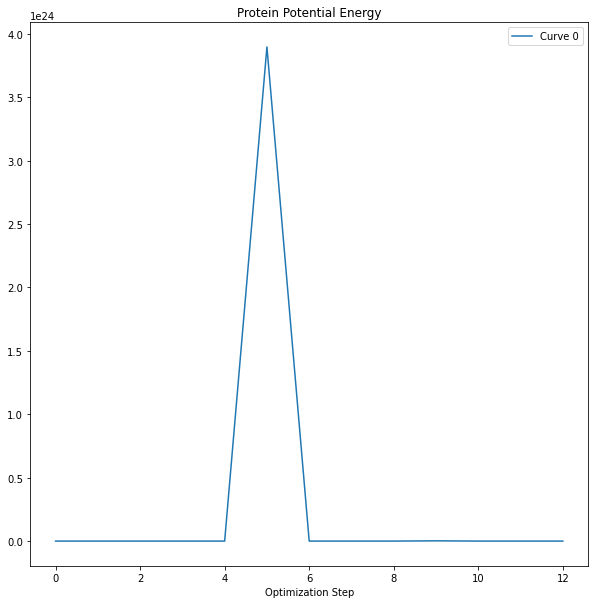

In [2]:
m = SCNMinimizer({}, verbose=True)

# p_original = scn.SCNProtein.from_pkl("4U6F_51_M5.pkl")
p_original = scn.SCNProtein.from_pkl("3TXA_1_A.pkl")
p_original.torch()
p_original.fastbuild(add_hydrogens=True, inplace=True)
p_original.numpy()

p = m.minimize_scnprotein(p_original.copy(),
                      optimizer="sgd",
                      starting_lr=1,
                      max_iter=20,
                      epochs=200,
                      lr_decay=True,
                      max_eval=5,
                      patience=3,
                      path=f"./{p_original.id}.pkl",
                      record_structure_every_n=1,
                      suffix="gcv1",
                      grad_clip=1)
diff_angles = (p.angles - p_original.angles).reshape(-1, 3)
print("Mean angle difference =", diff_angles[~np.isnan(diff_angles)].mean())


In [3]:
p_original.to_3Dmol(other_protein=p)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

Starting minimization...
   LR = 1
Starting loss = 824807629596108.88
Epoch 0:	3774085587014.92
Updated best angles.
Epoch 1:	31245000364729.95
Epoch 2:	226671170358915.00
Epoch     3: reducing learning rate of group 0 to 1.0000e-01.
Epoch 3:	6244426376522.88
Epoch 4:	66523751461682.31
Epoch     5: reducing learning rate of group 0 to 1.0000e-02.
Final loss = 66523751461680.84
Updated protein angles and hcoords.
Minimization complete.
Mean angle difference = 7.720707994149525e-06


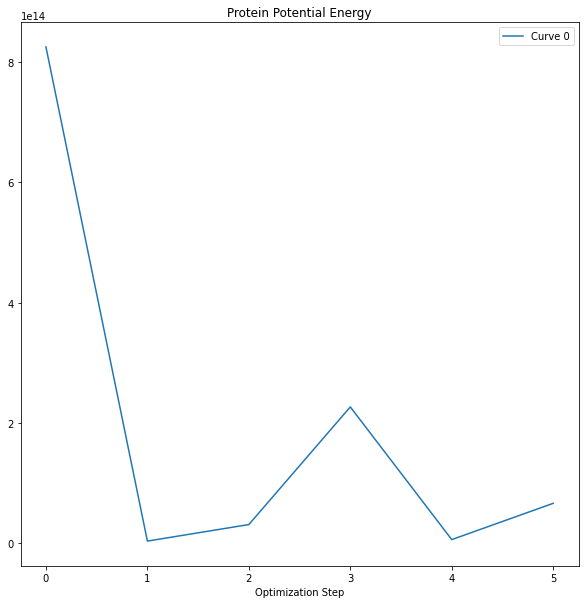

In [5]:
m = SCNMinimizer({}, verbose=True)

# p_original = scn.SCNProtein.from_pkl("4U6F_51_M5.pkl")
p_original = scn.SCNProtein.from_pkl("3TXA_1_A.pkl")
p_original.torch()
p_original.fastbuild(add_hydrogens=True, inplace=True)
p_original.numpy()

p = m.minimize_scnprotein(p_original.copy(),
                      optimizer="lbfgs",
                      starting_lr=1,
                      max_iter=20,
                      max_eval=30,
                      epochs=50,
                      lr_decay=True,
                      patience=3,
                      path=f"./{p_original.id}.pkl",
                      record_structure_every_n=1,
                      suffix="lbfgs",
                      grad_clip=None)
diff_angles = (p.angles - p_original.angles).reshape(-1, 3)
print("Mean angle difference =", diff_angles[~np.isnan(diff_angles)].mean())


# 1QQB

In [69]:
x = d["1QQB_d1qqba1"]
x.to_3Dmol()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

Starting minimization...
   LR = 1
Starting loss = 52552.24


/net/pulsar/home/koes/jok120/repos/sidechainnet/sidechainnet/dataloaders/SCNProtein.py:825: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.hcoords = torch.tensor(self.hcoords)


Epoch 0:	52552.24
Updated best angles.
Epoch 1:	1872497959105215445598208.00
Epoch 2:	9955181293005746176.00
Epoch     3: reducing learning rate of group 0 to 1.0000e-01.
Epoch 3:	555614790566449792.00
Epoch 4:	143911249100446892032.00
Epoch     5: reducing learning rate of group 0 to 1.0000e-02.
Final loss = 143911249100446892032.00
The protein was not minimized correctly. Lowering LR  to 0.1 and trying again.
   LR = 0.1
Starting loss = 52552.24
Epoch 0:	52552.24
Epoch 1:	1948736863886387968.00
Epoch 2:	36155655743190.48
Epoch     3: reducing learning rate of group 0 to 1.0000e-02.
Epoch 3:	7525625255224.37
Final loss = 7525625255224.33
The protein was not minimized correctly. Lowering LR  to 0.01 and trying again.
   LR = 0.01
Starting loss = 52552.24
Epoch 0:	52552.24
Epoch 1:	12694246.73
Epoch 2:	102948.63
Epoch     3: reducing learning rate of group 0 to 1.0000e-03.
Epoch 3:	2356.74
Updated best angles.
Epoch 4:	1796.90
Updated best angles.
Epoch 5:	1369.18
Updated best angles.
E

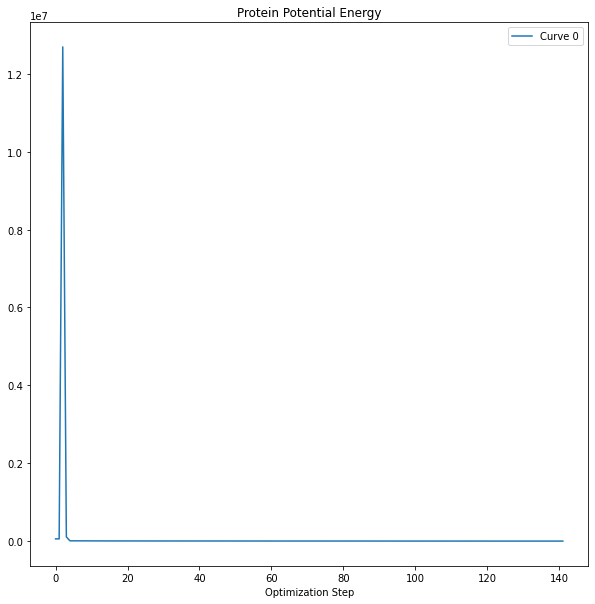

In [9]:
m = SCNMinimizer({}, verbose=True)

# p_original = scn.SCNProtein.from_pkl("4U6F_51_M5.pkl")
p_original = scn.SCNProtein.from_pkl("1QQB_d1qqba1.pkl")
p_original.torch()
p_original.fastbuild(add_hydrogens=True, inplace=True)
p_original.numpy()

p = m.minimize_scnprotein(p_original.copy(),
                      optimizer="sgd",
                      starting_lr=1,
                      max_iter=20,
                      epochs=200,
                      lr_decay=True,
                      max_eval=5,
                      patience=3,
                      path=f"./{p_original.id}.pkl",
                      record_structure_every_n=1,
                      suffix="gcv1",
                      grad_clip=1)
diff_angles = (p.angles - p_original.angles).reshape(-1, 3)
print("Mean angle difference =", diff_angles[~np.isnan(diff_angles)].mean())


In [10]:
p_original.to_3Dmol(other_protein=p)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

Starting minimization...
   LR = 1
Starting loss = 52552.24


/net/pulsar/home/koes/jok120/repos/sidechainnet/sidechainnet/dataloaders/SCNProtein.py:825: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.hcoords = torch.tensor(self.hcoords)


Epoch 0:	52552.24
Updated best angles.
Epoch 1:	21288.17
Updated best angles.
Epoch 2:	11495.59
Updated best angles.
Epoch 3:	8102.43
Updated best angles.
Epoch 4:	6781.59
Updated best angles.
Epoch 5:	6197.62
Updated best angles.
Epoch 6:	5896.40
Updated best angles.
Epoch 7:	5696.08
Updated best angles.
Epoch 8:	5529.21
Updated best angles.
Epoch 9:	5378.65
Updated best angles.
Epoch 10:	5240.23
Updated best angles.
Epoch 11:	5110.99
Updated best angles.
Epoch 12:	4989.47
Updated best angles.
Epoch 13:	4874.59
Updated best angles.
Epoch 14:	4765.64
Updated best angles.
Epoch 15:	4662.01
Updated best angles.
Epoch 16:	4563.05
Updated best angles.
Epoch 17:	4468.38
Updated best angles.
Epoch 18:	4377.67
Updated best angles.
Epoch 19:	4290.60
Updated best angles.
Epoch 20:	4206.82
Updated best angles.
Epoch 21:	4126.21
Updated best angles.
Epoch 22:	4048.54
Updated best angles.
Epoch 23:	3973.63
Updated best angles.
Epoch 24:	3901.33
Updated best angles.
Epoch 25:	3831.43
Updated best a

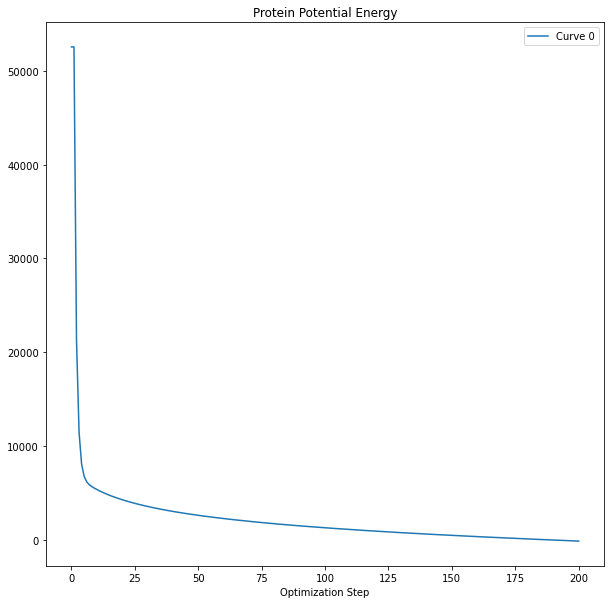

In [11]:
m = SCNMinimizer({}, verbose=True)

# p_original = scn.SCNProtein.from_pkl("4U6F_51_M5.pkl")
p_original = scn.SCNProtein.from_pkl("1QQB_d1qqba1.pkl")
p_original.torch()
p_original.fastbuild(add_hydrogens=True, inplace=True)
p_original.numpy()

p = m.minimize_scnprotein(p_original.copy(),
                      optimizer="sgd",
                      starting_lr=1,
                      max_iter=20,
                      epochs=200,
                      lr_decay=True,
                      max_eval=5,
                      patience=3,
                      path=f"./{p_original.id}.pkl",
                      record_structure_every_n=1,
                      suffix="",
                      grad_clip=None)
diff_angles = (p.angles - p_original.angles).reshape(-1, 3)
print("Mean angle difference =", diff_angles[~np.isnan(diff_angles)].mean())


In [12]:
p_original.to_3Dmol(other_protein=p)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

# 1QF7

Starting minimization...
   LR = 1
Starting loss = 5892827229694803.00


/net/pulsar/home/koes/jok120/repos/sidechainnet/sidechainnet/dataloaders/SCNProtein.py:825: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.hcoords = torch.tensor(self.hcoords)


Epoch 0:	5892827229690855.00
Updated best angles.
Epoch 1:	4073066812075811536896.00
Epoch 2:	26017264304060192130072576.00
Epoch     3: reducing learning rate of group 0 to 1.0000e-01.
Epoch 3:	1244945835585859357769728.00
Epoch 4:	1732072721549471915180032.00
Epoch     5: reducing learning rate of group 0 to 1.0000e-02.
Final loss = 1732072721549472452050944.00
The protein was not minimized correctly. Lowering LR  to 0.1 and trying again.
   LR = 0.1
Starting loss = 5892827229690776.00
Epoch 0:	5892827229694596.00
Epoch 1:	1803349400930591744.00
Epoch 2:	429746270419942157320192.00
Epoch     3: reducing learning rate of group 0 to 1.0000e-02.
Epoch 3:	152387800293671043072.00
Final loss = 152387800293670813696.00
The protein was not minimized correctly. Lowering LR  to 0.01 and trying again.
   LR = 0.01
Starting loss = 5892827229693322.00
Epoch 0:	5892827229695588.00
Epoch 1:	631236960779743657984.00
Epoch 2:	24800939382113.97
Updated best angles.
Epoch 3:	4492305525903778.00
Epoch 

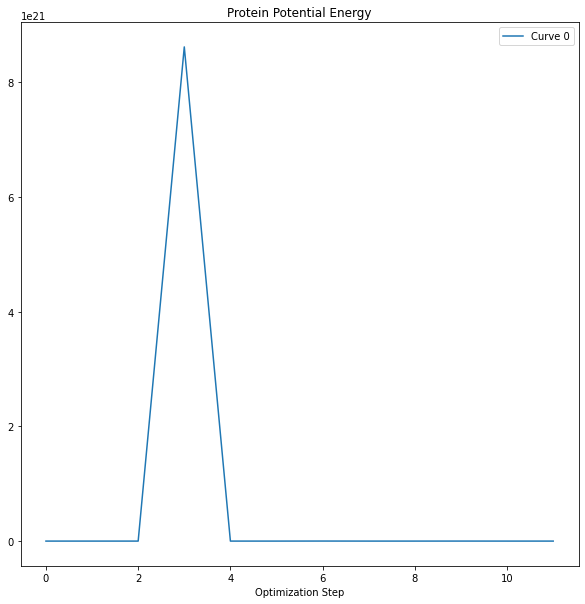

In [43]:
m = SCNMinimizer({}, verbose=True)

# p_original = scn.SCNProtein.from_pkl("4U6F_51_M5.pkl")
p_original = scn.SCNProtein.from_pkl("1QF7_d1qf7d2.pkl")
p_original.torch()
p_original.fastbuild(add_hydrogens=True, inplace=True)
p_original.numpy()

p = m.minimize_scnprotein(p_original.copy(),
                      optimizer="sgd",
                      starting_lr=1,
                      max_iter=20,
                      epochs=200,
                      lr_decay=True,
                      max_eval=5,
                      patience=3,
                      path=f"./{p_original.id}.pkl",
                      record_structure_every_n=1,
                      suffix="gcv1",
                      grad_clip=1)
diff_angles = (p.angles - p_original.angles).reshape(-1, 3)
print("Mean angle difference =", diff_angles[~np.isnan(diff_angles)].mean())


In [44]:
p_original.to_3Dmol(other_protein=p)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

Starting minimization...
   LR = 1
Starting loss = 5892827229694429.00
Epoch 0:	5892827229693846.00
Updated best angles.
Epoch 1:	948434.27
Updated best angles.
Epoch 2:	536669.00
Updated best angles.
Epoch 3:	31478802.03
Epoch 4:	74717067.35
Epoch     5: reducing learning rate of group 0 to 1.0000e-01.
Epoch 5:	144317553.14
Epoch 6:	32177046.24
Epoch     7: reducing learning rate of group 0 to 1.0000e-02.
Final loss = 32177046.24
Updated protein angles and hcoords.
Minimization complete.
Mean angle difference = -6.987998451413068e-06


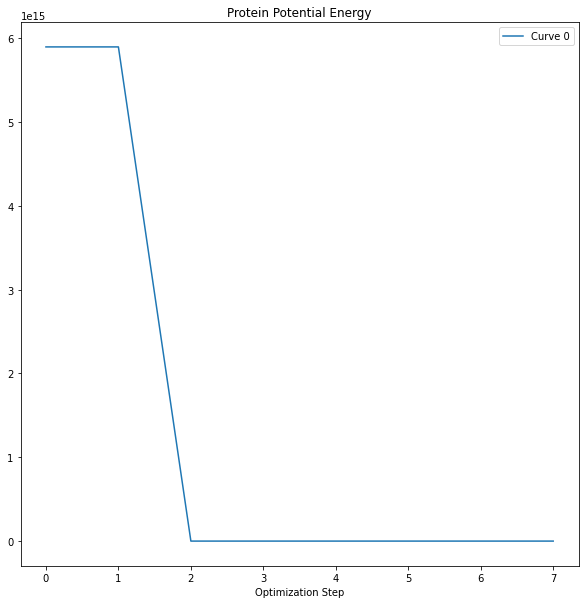

In [2]:
m = SCNMinimizer({}, verbose=True)

# p_original = scn.SCNProtein.from_pkl("4U6F_51_M5.pkl")
p_original = scn.SCNProtein.from_pkl("1QF7_d1qf7d2.pkl")
p_original.torch()
p_original.fastbuild(add_hydrogens=True, inplace=True)
p_original.numpy()

p = m.minimize_scnprotein(p_original.copy(),
                      optimizer="sgd",
                      starting_lr=1,
                      max_iter=20,
                      epochs=200,
                      lr_decay=True,
                      max_eval=5,
                      patience=3,
                      path=f"./{p_original.id}.pkl",
                      record_structure_every_n=None,
                      suffix="",
                      grad_clip=None)
diff_angles = (p.angles - p_original.angles).reshape(-1, 3)
print("Mean angle difference =", diff_angles[~np.isnan(diff_angles)].mean())


In [7]:
p_original.to_3Dmol(other_protein=p)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [8]:
p_original.rmsd_ca(p)

AttributeError: 'numpy.ndarray' object has no attribute 'cpu'

Starting minimization...
   LR = 0.1
Starting loss = 5892827229694432.00


/net/pulsar/home/koes/jok120/repos/sidechainnet/sidechainnet/dataloaders/SCNProtein.py:825: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.hcoords = torch.tensor(self.hcoords)


Epoch 0:	5892827229693939.00
Updated best angles.
Epoch 1:	8557013767422.83
Updated best angles.
Epoch 2:	15654017561.67
Updated best angles.
Epoch 3:	794645709.46
Updated best angles.
Epoch 4:	241521812.31
Updated best angles.
Epoch 5:	26418230.76
Updated best angles.
Epoch 6:	3609526.48
Updated best angles.
Epoch 7:	1224267.22
Updated best angles.
Epoch 8:	891496.63
Updated best angles.
Epoch 9:	824377.49
Updated best angles.
Epoch 10:	692945.28
Updated best angles.
Epoch 11:	762101.56
Epoch 12:	678544.90
Updated best angles.
Epoch 13:	730651.30
Epoch 14:	662081.36
Updated best angles.
Epoch 15:	708717.43
Epoch 16:	678989.30
Epoch 17:	759934.85
Epoch 18:	714419.35
Epoch 19:	838222.94
Epoch 20:	699402.45
Epoch    21: reducing learning rate of group 0 to 1.0000e-02.
Epoch 21:	833882.15
Epoch 22:	809458.56
Epoch 23:	791608.12
Epoch 24:	780373.01
Epoch 25:	774175.62
Final loss = 774175.62
Updated protein angles and hcoords.
Minimization complete.
Mean angle difference = -1.68989547036956

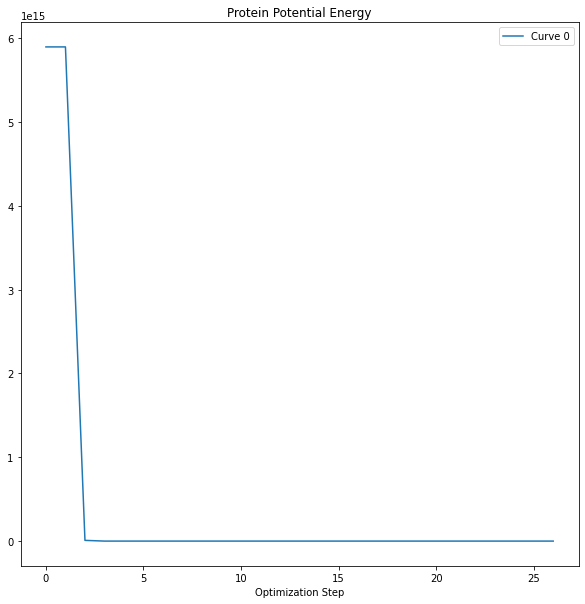

In [49]:
m = SCNMinimizer({}, verbose=True)

# p_original = scn.SCNProtein.from_pkl("4U6F_51_M5.pkl")
p_original = scn.SCNProtein.from_pkl("1QF7_d1qf7d2.pkl")
p_original.torch()
p_original.fastbuild(add_hydrogens=True, inplace=True)
p_original.numpy()

p = m.minimize_scnprotein(p_original.copy(),
                      optimizer="sgd",
                      starting_lr=1e-1,
                      max_iter=20,
                      epochs=200,
                      lr_decay=True,
                      max_eval=5,
                      patience=10,
                      path=f"./{p_original.id}.pkl",
                      record_structure_every_n=1,
                      suffix="patience10",
                      grad_clip=None)
diff_angles = (p.angles - p_original.angles).reshape(-1, 3)
print("Mean angle difference =", diff_angles[~np.isnan(diff_angles)].mean())


In [50]:
p_original.to_3Dmol(other_protein=p)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

# 4p99_A

Starting minimization...
   LR = 1
Starting loss = 68096.26
Epoch 0:	68096.26
Epoch 1:	1509227744483701515094065152.00
Epoch 2:	108716185022986939531264.00
Epoch     3: reducing learning rate of group 0 to 1.0000e-01.
Epoch 3:	1519123820400821447251984384.00
Final loss = 1519123820400821447251984384.00
The protein was not minimized correctly. Lowering LR  to 0.1 and trying again.
   LR = 0.1
Starting loss = 68096.26
Epoch 0:	68096.26
Epoch 1:	834748524249811.88
Epoch 2:	526430797017464.69
Epoch     3: reducing learning rate of group 0 to 1.0000e-02.
Epoch 3:	3801874283954507776.00
Final loss = 3801874283954508800.00
The protein was not minimized correctly. Lowering LR  to 0.01 and trying again.
   LR = 0.01
Starting loss = 68096.26
Epoch 0:	68096.26
Updated best angles.
Epoch 1:	14765914652064139264.00
Epoch 2:	427243321341836.88
Epoch     3: reducing learning rate of group 0 to 1.0000e-03.
Epoch 3:	3081112512471709.50
Epoch 4:	9110904074431729664.00
Epoch     5: reducing learning rate

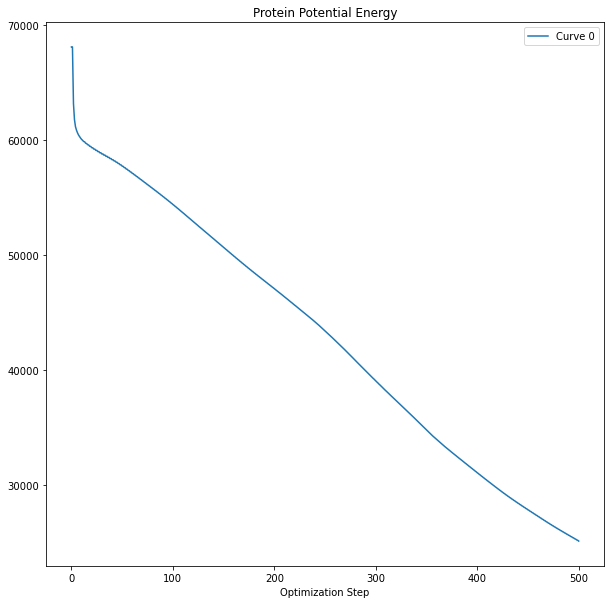

In [58]:
m = SCNMinimizer({}, verbose=True)

# p_original = scn.SCNProtein.from_pkl("4U6F_51_M5.pkl")
p_original = scn.SCNProtein.from_pkl("4P99_1_A.pkl")
p_original.torch()
p_original.fastbuild(add_hydrogens=True, inplace=True)
p_original.numpy()

p = m.minimize_scnprotein(p_original.copy(),
                      optimizer="sgd",
                      starting_lr=1,
                      max_iter=20,
                      epochs=500,
                      lr_decay=True,
                      max_eval=5,
                      patience=3,
                      path=f"./{p_original.id}.pkl",
                      record_structure_every_n=1,
                      suffix="gcv1",
                      grad_clip=1)
diff_angles = (p.angles - p_original.angles).reshape(-1, 3)
print("Mean angle difference =", diff_angles[~np.isnan(diff_angles)].mean())


In [59]:
p_original.to_3Dmol(other_protein=p)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [60]:
p_original.rmsd_to(p)

AssertionError: Warning: Protein must not have hydrogens. RMSD is not yet implemented for heavy atoms only.